In [5]:
import nibabel as nib
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, losses, metrics
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, concatenate, Input
import random
from scipy.ndimage import zoom
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.models import load_model
from PIL import Image




In [11]:
import os

# Define the paths to the training and testing data directories
training_data = "C:/Users/DELL/Downloads/Training-PNG"  # Replace with your directory path
testing_data = "C:/Users/DELL/Downloads/Testing-PNG"  # Replace with your directory path

# Function to list all PNG files in a directory
def list_png_files(directory):
    png_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith('.png'):  # Check for .png extensions (case-insensitive)
                png_files.append(os.path.join(root, file))
    return png_files

# Load and print the file paths for training data
print("Training Data Files:")
training_files = list_png_files(training_data)
for file in training_files:
    print(file)


Training Data Files:
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_000.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_001.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_002.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_003.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_004.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_005.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_006.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_007.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_008.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_009.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_010.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_011.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_012.png
C:/Users/DELL/Downloads/Training-PNG\segmentation-0.nii_slice_013.png

In [12]:
# Load and print the file paths for testing data
print("\nTesting Data Files:")
testing_files = list_png_files(testing_data)  # Use the updated PNG function
for file in testing_files:
    print(file)



Testing Data Files:
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_000.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_001.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_002.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_003.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_004.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_005.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_006.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_007.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_008.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_009.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_010.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_011.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_012.png
C:/Users/DELL/Downloads/Testing-PNG\test-volume-0.nii_slice_013.png
C:/Users/DELL/Downloads/Tes

In [13]:
import os


# Function to count and list files in a directory with a specific prefix and suffix
def count_files(directory, prefix=None, suffix=".png"):
    if not os.path.exists(directory):
        print(f"Directory not found: {directory}")
        return []
    # Filter files based on the prefix and suffix
    files = sorted([
        f for f in os.listdir(directory)
        if (prefix is None or f.startswith(prefix)) and f.endswith(suffix)
    ])
    return files

# Count volumes and segmentations in the training data
training_volumes = count_files(training_data, prefix="volume")
training_segmentations = count_files(training_data, prefix="segmentation")

# Count volumes in the testing data
testing_volumes = count_files(testing_data, prefix="test-volume")

# Print results
print("Training Data:")
print(f"  Total Volumes: {len(training_volumes)}")
print(f"  Total Segmentations: {len(training_segmentations)}")
print("\nTesting Data:")
print(f"  Total Test Volumes: {len(testing_volumes)}")


Training Data:
  Total Volumes: 58638
  Total Segmentations: 58638

Testing Data:
  Total Test Volumes: 26608


In [16]:
from PIL import Image
import os

def print_overall_shapes(file_list, directory, label):
    for file_name in file_list:
        file_path = os.path.join(directory, file_name)
        try:
            # Load the first file to get the shape
            img = Image.open(file_path)
            print(f"Overall shape of {label}: {img.size}")  # img.size returns (width, height)
            break  # We only need to check the shape of one file as they are all the same
        except Exception as e:
            print(f"Could not load {file_name}: {e}")

# Print overall shapes for training volumes and segmentations
print_overall_shapes(training_volumes, training_data, "Training Volumes")
print_overall_shapes(training_segmentations, training_data, "Training Segmentations")

# Print overall shapes for testing volumes
print_overall_shapes(testing_volumes, testing_data, "Testing Volumes")


Overall shape of Training Volumes: (512, 512)
Overall shape of Training Segmentations: (512, 512)
Overall shape of Testing Volumes: (512, 512)


In [18]:

# Function to normalize image intensity for PNG images
def normalize_image(image_path, min_val=0, max_val=255):
    try:
        # Load the image and convert it to grayscale
        img = Image.open(image_path).convert('L')  # Convert to grayscale (1 channel)
        img_array = np.array(img, dtype=np.float32)  # Convert to NumPy array
        
        # Clip the values and normalize
        img_array = np.clip(img_array, min_val, max_val)
        normalized_image = (img_array - min_val) / (max_val - min_val)  # Normalize to 0-1 range
        return normalized_image
    except Exception as e:
        print(f"Error normalizing image at {image_path}: {e}")
        return None


In [19]:
# Function to resize a 2D image
def resize_image(image_path, target_shape=(128, 128), is_mask=False):
    try:
        # Load the image
        img = Image.open(image_path)
        
        # Set interpolation method: nearest for masks, bilinear for normal images
        interpolation = Image.NEAREST if is_mask else Image.BILINEAR
        
        # Resize the image
        resized_img = img.resize(target_shape, interpolation)
        
        # Convert the resized image to a NumPy array
        resized_array = np.array(resized_img, dtype=np.float32 if not is_mask else np.uint8)
        return resized_array
    except Exception as e:
        print(f"Error resizing image at {image_path}: {e}")
        return None


In [20]:
from PIL import Image
import numpy as np

def load_and_preprocess_png(file_path, target_shape=(128, 128), min_val=0, max_val=255, is_mask=False):
    try:
        # Load the image
        img = Image.open(file_path)
        
        # Convert to grayscale if not already (for consistent processing)
        img = img.convert('L') if not is_mask else img
        
        # Convert to a NumPy array
        data = np.array(img, dtype=np.float32 if not is_mask else np.uint8)
        
        if is_mask:
            # Ensure masks have only binary values (e.g., map any non-zero value to 1)
            data = np.where(data > 0, 1, 0)  # Convert to binary (0 and 1)
        else:
            # Normalize to the range 0-1
            data = np.clip(data, min_val, max_val)
            data = (data - min_val) / (max_val - min_val)
        
        # Resize the image to the target shape
        resized_data = np.array(
            Image.fromarray(data).resize(target_shape, Image.NEAREST if is_mask else Image.BILINEAR)
        )
        return resized_data
    except Exception as e:
        print(f"Error loading and processing {file_path}: {e}")
        return None


In [21]:
# Process training data for PNG files
all_volumes = []
all_segmentations = []

for vol, seg in zip(training_volumes, training_segmentations):
    vol_path = os.path.join(training_data, vol)  # Path for volume file
    seg_path = os.path.join(training_data, seg)  # Path for segmentation file
    
    # Load and preprocess the volume and segmentation mask
    vol_data = load_and_preprocess_png(vol_path, target_shape=(128, 128), is_mask=False)
    seg_data = load_and_preprocess_png(seg_path, target_shape=(128, 128), is_mask=True)
    
    if vol_data is not None and seg_data is not None:
        all_volumes.append(vol_data)  # Append preprocessed volume
        all_segmentations.append(seg_data)  # Append preprocessed segmentation mask

# Convert to numpy arrays and add channel dimension
X_train = np.expand_dims(np.array(all_volumes), axis=-1)  # Add channel dimension for volumes
y_train = np.expand_dims(np.array(all_segmentations), axis=-1)  # Add channel dimension for masks

# Print the shapes of the training data and labels
print(f"Training data shape (X_train): {X_train.shape}")  # Expected shape: (num_samples, height, width, 1)
print(f"Training label shape (y_train): {y_train.shape}")  # Expected shape: (num_samples, height, width, 1)


Training data shape (X_train): (58638, 128, 128, 1)
Training label shape (y_train): (58638, 128, 128, 1)


In [22]:
# Print unique values in y_train to verify segmentation classes
print(f"Unique values in y_train (segmentation labels): {np.unique(y_train)}")

# Print the min and max values of X_train to confirm normalization
print(f"X_train intensity range: {X_train.min()} - {X_train.max()}")


Unique values in y_train (segmentation labels): [0 1]
X_train intensity range: 0.0 - 1.0


In [23]:
# Process testing data for PNG files
all_test_volumes = []

# Loop through all testing volumes
for vol in testing_volumes:
    vol_path = os.path.join(testing_data, vol)  # Get the path for the volume file
    
    # Load and preprocess the volume (no need for is_mask argument here)
    vol_data = load_and_preprocess_png(vol_path, target_shape=(128, 128), is_mask=False)
    
    if vol_data is not None:
        all_test_volumes.append(vol_data)  # Add preprocessed volume to the list

# Convert the list to a numpy array and add channel dimension
X_test = np.expand_dims(np.array(all_test_volumes), axis=-1)  # Adding channel dimension

# Print the shape of the testing data
print(f"Testing data shape (X_test): {X_test.shape}")


Testing data shape (X_test): (26608, 128, 128, 1)


In [25]:
import random  # Import for random sampling
import matplotlib.pyplot as plt  # Import for plotting

def plot_random_images_training(volumes, segmentations, dataset_type="Training", num_images=3):
    if len(volumes) < num_images:
        raise ValueError(f"Number of images to plot ({num_images}) exceeds dataset size ({len(volumes)}).")
    
    # Select random indices
    random_indices = random.sample(range(len(volumes)), num_images)
    
    for idx in random_indices:
        volume = volumes[idx]
        segmentation = segmentations[idx]
        
        fig, axes = plt.subplots(1, 2, figsize=(8, 4))
        
        # Display the volume
        axes[0].imshow(volume, cmap='gray')  # Grayscale colormap for volumes
        axes[0].set_title(f'{dataset_type} Volume {idx+1}')
        axes[0].axis('off')
        
        # Display the segmentation
        axes[1].imshow(segmentation, cmap='plasma')  # Plasma colormap for segmentations
        axes[1].set_title(f'{dataset_type} Segmentation {idx+1}')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()


In [24]:
import random  # Import for random sampling
import matplotlib.pyplot as plt  # Import for plotting

def plot_random_images_testing(volumes, dataset_type="Testing", num_images=3):
    if len(volumes) < num_images:
        raise ValueError(f"Number of images to plot ({num_images}) exceeds dataset size ({len(volumes)}).")
    
    # Select random indices
    random_indices = random.sample(range(len(volumes)), num_images)
    
    for idx in random_indices:
        volume = volumes[idx]
        
        # Plotting the image
        fig, ax = plt.subplots(figsize=(6, 4))
        
        # Display the volume image
        ax.imshow(volume, cmap='gray')  # Grayscale colormap for volume images
        ax.set_title(f'{dataset_type} Volume {idx+1}')
        ax.axis('off')
        
        plt.tight_layout()
        plt.show()


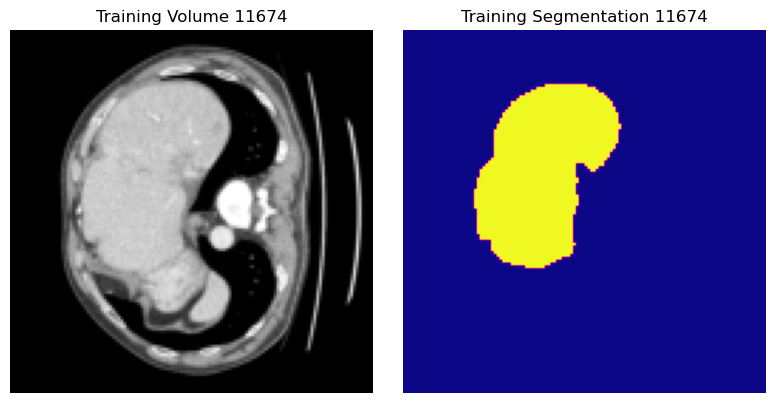

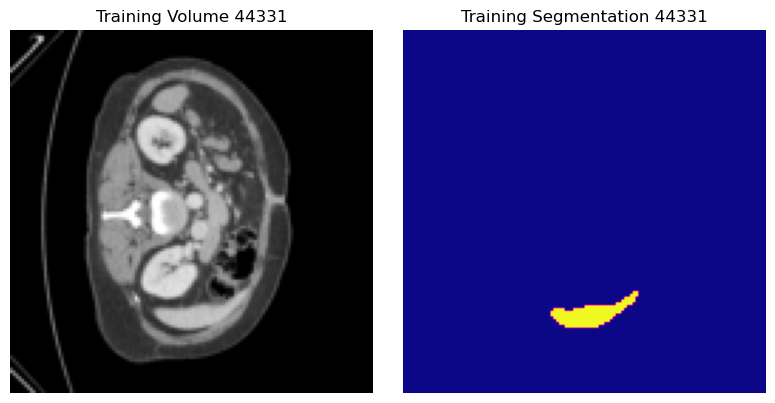

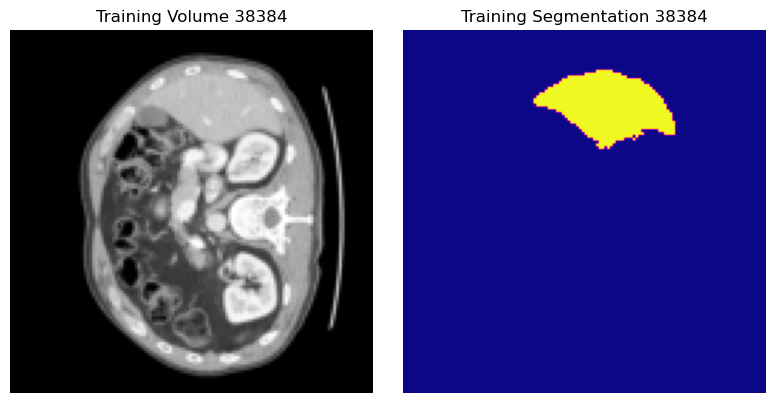

In [29]:
# Visualize random training images (with volumes and segmentations)
plot_random_images_training(all_volumes, all_segmentations, dataset_type="Training", num_images=3)



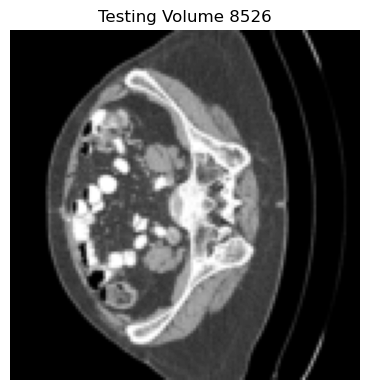

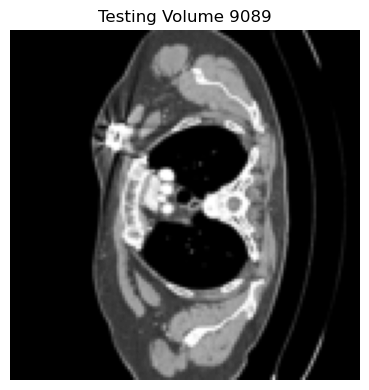

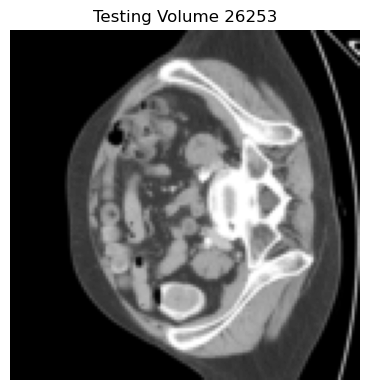

In [30]:
# Visualize random testing images (only volumes)
plot_random_images_testing(all_test_volumes, dataset_type="Testing", num_images=3)


In [31]:
import tensorflow as tf

# Define the custom metrics for 2D .png images
def dice_coefficient(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)  # Cast y_pred to float32
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred))

def iou(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)  # Cast y_pred to float32
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / union

def precision(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)  # Cast y_pred to float32
    true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
    predicted_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_pred, 0, 1)))
    return true_positives / (predicted_positives + tf.keras.backend.epsilon())

def recall(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)  # Cast y_pred to float32
    true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
    possible_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true, 0, 1)))
    return true_positives / (possible_positives + tf.keras.backend.epsilon())

def specificity(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)  # Cast y_pred to float32
    true_negatives = tf.reduce_sum(tf.round(tf.clip_by_value((1 - y_true) * (1 - y_pred), 0, 1)))
    possible_negatives = tf.reduce_sum(tf.round(tf.clip_by_value(1 - y_true, 0, 1)))
    return true_negatives / (possible_negatives + tf.keras.backend.epsilon())

def f1_score(y_true, y_pred):
    prec = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * (prec * rec) / (prec + rec + tf.keras.backend.epsilon())

def jaccard_index(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)  # Cast y_pred to float32
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / (union + tf.keras.backend.epsilon())


In [32]:
import tensorflow as tf
from tensorflow.keras import models
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, concatenate, Input, LayerNormalization, MultiHeadAttention, Dropout, Add, Dense
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.optimizers import Adam

# Transformer Block for 2D inputs
def transformer_block_2d(inputs, num_heads=8, ff_dim=32):
    transformer_input = LayerNormalization(epsilon=1e-6)(inputs)
    attention_output = MultiHeadAttention(num_heads=num_heads, key_dim=inputs.shape[-1])(transformer_input, transformer_input)
    attention_output = Dropout(0.1)(attention_output)
    out1 = Add()([inputs, attention_output])
    ffn_output = tf.keras.Sequential([
        LayerNormalization(epsilon=1e-6),
        Conv2D(filters=ff_dim, kernel_size=1, activation="relu"),
        Dropout(0.1),
        Conv2D(inputs.shape[-1], kernel_size=1)
    ])(out1)
    return Add()([out1, ffn_output])

# Hybrid U-Net + Transformer Model for 2D image data
def create_hybrid_unet_transformer_2d(input_shape):
    inputs = Input(input_shape)
    s = inputs

    # U-Net Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(s)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)

    # Bridge with Transformer Block
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    c5 = transformer_block_2d(c5)

    # U-Net Decoder
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = models.Model(inputs, outputs)
    return model


In [33]:
print(X_train.shape)  # Should output something like (batch_size, 128, 128, 64, 1)
print(y_train.shape)  # Should match the corresponding output shape


(58638, 128, 128, 1)
(58638, 128, 128, 1)


In [35]:
# Define the model for 2D data
model = create_hybrid_unet_transformer_2d(input_shape=(128, 128, 1))

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='binary_crossentropy',  # Use 'categorical_crossentropy' for multi-class segmentation
    metrics=[dice_coefficient, iou, precision, recall, specificity, f1_score, jaccard_index]
)

# Display the model summary
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 512) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 8, 8,      │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 8, 8,      │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 8, 8,      │      2,048 │ conv2d_9[0][0]    │
│ (LayerNormalizatio… │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 8, 8,      │ 33,580,032 │ layer_normalizat

 Total params: 65,028,513 (248.06 MB)

 Trainable params: 65,028,513 (248.06 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
# Check the shapes of X_train and y_train
print(f"X_train shape: {X_train.shape}")  # Should be (131, 128, 128, 64, 1)
print(f"y_train shape: {y_train.shape}")  # Should be (131, 128, 128, 64, 1)

# Verify the pixel values in X_train (after normalization) and y_train (binary segmentation mask)
print(f"X_train min-max: {X_train.min()} - {X_train.max()}")  # Should be 0-1 (after normalization)
print(f"y_train unique values: {np.unique(y_train)}")  # Should be [0, 1] for binary segmentation


X_train shape: (58638, 128, 128, 1)
y_train shape: (58638, 128, 128, 1)
X_train min-max: 0.0 - 1.0
y_train unique values: [0 1]


In [37]:
# Learning rate scheduler function
def lr_schedule(epoch):
    initial_lr = 0.001
    lr = initial_lr * (0.1 ** (epoch // 10))  # Reduce LR by a factor of 0.1 every 10 epochs
    return lr

In [38]:
# EarlyStopping callback to stop training if no improvement is seen for 'patience' epochs
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [39]:
# Learning Rate Scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

In [42]:
# Train the model with callbacks
history = model.fit(
    X_train, y_train, epochs=1, batch_size=16, validation_split=0.2, 
    callbacks=[early_stopping, lr_scheduler]
)

2932/2932 ━━━━━━━━━━━━━━━━━━━━ 80088s 27s/step - dice_coefficient: 0.6202 - f1_score: 0.7220 - iou: 0.4642 - jaccard_index: 0.4642 - loss: 0.0281 - precision: 0.7750 - recall: 0.7044 - specificity: 0.9955 - val_dice_coefficient: 0.2346 - val_f1_score: 0.2479 - val_iou: 0.2000 - val_jaccard_index: 0.2000 - val_loss: 0.0164 - val_precision: 0.2622 - val_recall: 0.2523 - val_specificity: 0.9954 - learning_rate: 0.0010


In [45]:
# Save the trained model in the recommended format
model.save('C:/Users/DELL/Downloads/my_model.keras')

print("Model saved successfully!")


Model saved successfully!


In [47]:

# Predict the masks using the trained model
predicted_masks = model.predict(X_test)  # Shape: (num_samples, 128, 128, num_slices, 1)



832/832 ━━━━━━━━━━━━━━━━━━━━ 6156s 7s/step


In [60]:
def visualize_2d_predictions(test_volumes, predicted_masks, num_samples=6, images_per_row=2):
    num_samples = min(num_samples, test_volumes.shape[0])  # Ensure we don't exceed the dataset size
    num_rows = (num_samples + images_per_row - 1) // images_per_row  # Calculate number of rows

    fig, axes = plt.subplots(num_rows, images_per_row * 2, figsize=(20, 4 * num_rows))
    fig.suptitle("Test Images and Predicted Masks", fontsize=16)

    for i in range(num_samples):
        # Extract a 2D slice and its corresponding mask
        original_image = test_volumes[i, :, :, 0]  # Remove the channel dimension
        mask_prediction = predicted_masks[i, :, :, 0]  # Remove the channel dimension

        # Compute row and column for the subplot
        row, col = divmod(i, images_per_row)
        original_idx = col * 2  # Index for original image
        prediction_idx = col * 2 + 1  # Index for predicted mask

        # Plot the original image
        axes[row, original_idx].imshow(original_image, cmap='gray')
        axes[row, original_idx].set_title(f"Test Image {i + 1}")
        axes[row, original_idx].axis("off")

        # Plot the predicted mask
        axes[row, prediction_idx].imshow(mask_prediction, cmap='plasma')
        axes[row, prediction_idx].set_title(f"Predicted Mask {i + 1}")
        axes[row, prediction_idx].axis("off")

    # Turn off any unused subplots
    for ax in axes.flat:
        if not ax.has_data():
            ax.axis("off")

    plt.tight_layout()
    plt.show()


In [58]:
print(f"X_test shape: {X_test.shape}")
print(f"predicted_masks shape: {predicted_masks.shape}")


X_test shape: (26608, 128, 128, 1)
predicted_masks shape: (26608, 128, 128, 1)


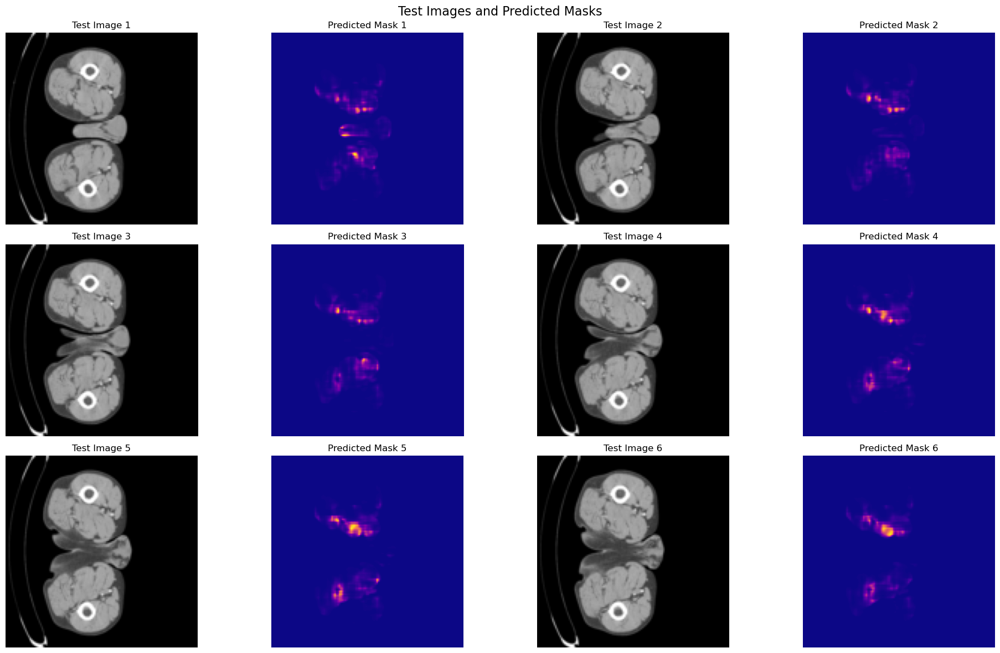

In [63]:
# Call the function to visualize predictions
visualize_2d_predictions(X_test, predicted_masks, num_samples=6, images_per_row=2)

In [55]:
# Load ground-truth masks from your testing data folder
ground_truth_masks = []
for vol in testing_volumes:  # Assuming the same structure as X_test
    vol_path = os.path.join(testing_data, vol)  # Path for ground-truth mask
    mask_data = load_and_preprocess_png(vol_path, target_shape=(128, 128), is_mask=True)
    if mask_data is not None:
        ground_truth_masks.append(mask_data)

# Convert to numpy array and add channel dimension
ground_truth_masks = np.expand_dims(np.array(ground_truth_masks), axis=-1)

print(f"Ground-truth masks shape: {ground_truth_masks.shape}")


Ground-truth masks shape: (26608, 128, 128, 1)


In [62]:
from sklearn.metrics import jaccard_score
import numpy as np

# Assuming ground_truth_masks has the same shape as predicted_masks
dice_scores = []
iou_scores = []

for i in range(predicted_masks.shape[0]):
    pred = (predicted_masks[i, :, :, 0] > 0.5).astype(np.uint8)  # Threshold the predicted mask
    gt = ground_truth_masks[i, :, :, 0]  # Extract the corresponding ground truth mask

    intersection = np.sum(pred * gt)
    dice = (2.0 * intersection) / (np.sum(pred) + np.sum(gt))
    iou = intersection / (np.sum(pred) + np.sum(gt) - intersection)

    dice_scores.append(dice)
    iou_scores.append(iou)

print(f"Average Dice Score: {np.mean(dice_scores):.4f}")
print(f"Average IoU: {np.mean(iou_scores):.4f}")


Average Dice Score: 0.0952
Average IoU: 0.0585
